In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, f1_score, precision_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report




   battery_power  blue  clock_speed  dual_sim  fc  four_g  int_memory  m_dep  \
0            842     0          2.2         0   1       0           7    0.6   
1           1021     1          0.5         1   0       1          53    0.7   
2            563     1          0.5         1   2       1          41    0.9   
3            615     1          2.5         0   0       0          10    0.8   
4           1821     1          1.2         0  13       1          44    0.6   

   mobile_wt  n_cores  ...  px_height  px_width   ram  sc_h  sc_w  talk_time  \
0        188        2  ...         20       756  2549     9     7         19   
1        136        3  ...        905      1988  2631    17     3          7   
2        145        5  ...       1263      1716  2603    11     2          9   
3        131        6  ...       1216      1786  2769    16     8         11   
4        141        2  ...       1208      1212  1411     8     2         15   

   three_g  touch_screen  wifi  price_

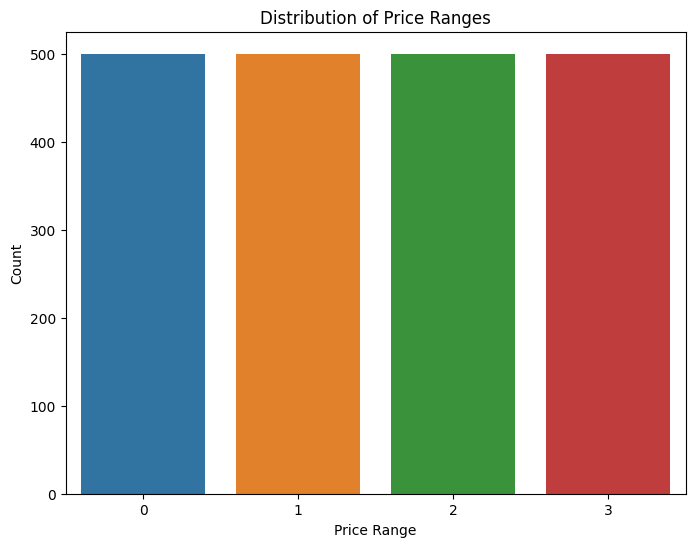

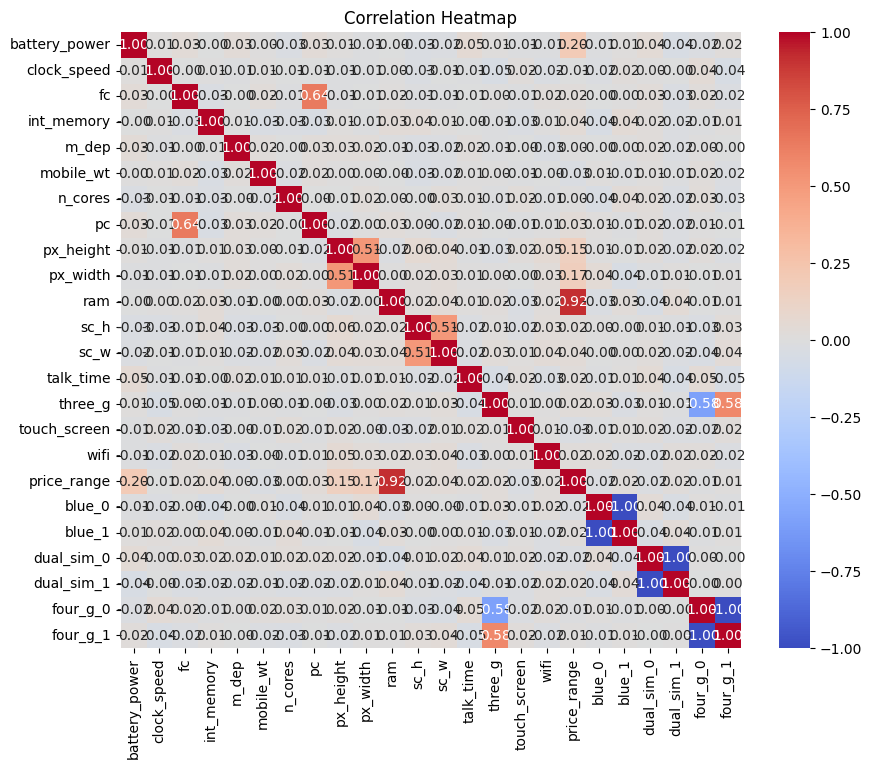

c:\Users\john.igolo\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


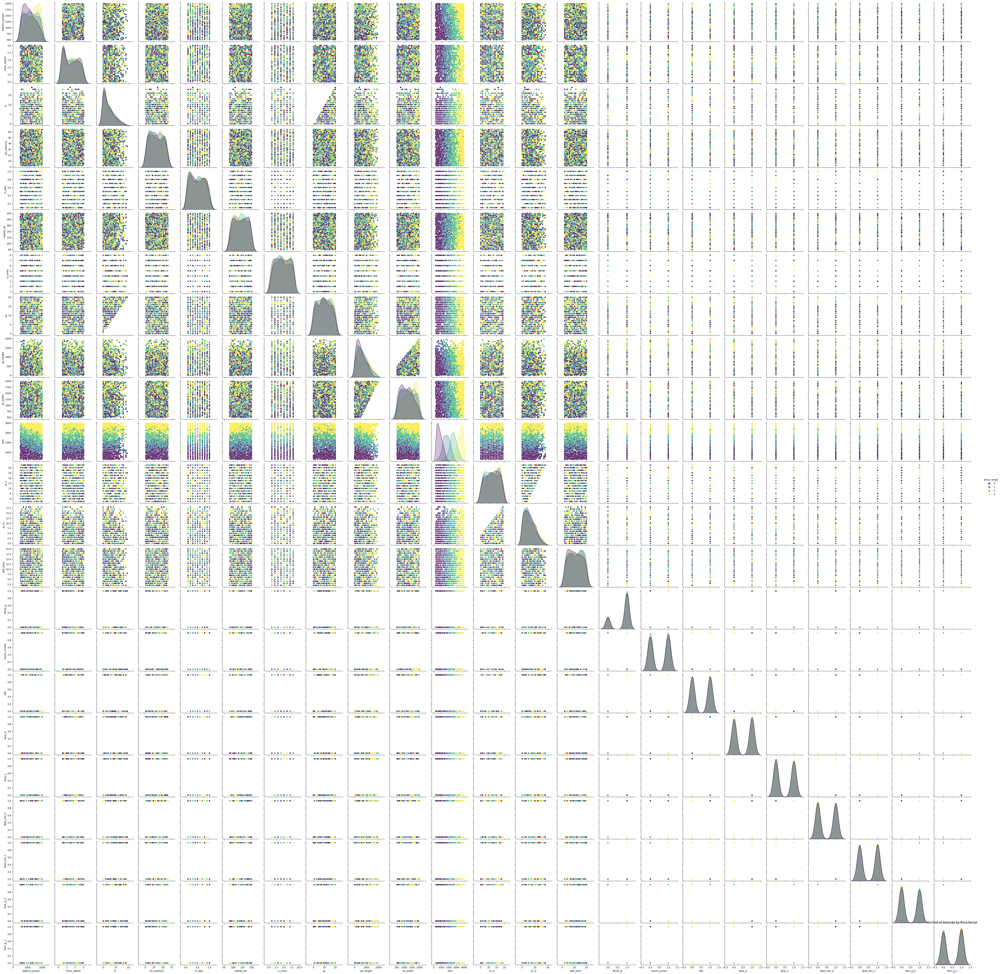

Model: Random Forest
Accuracy: 0.86
F1 Score: 0.87
Precision: 0.87
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.94      0.93       105
           1       0.84      0.79      0.81        91
           2       0.76      0.83      0.79        92
           3       0.93      0.88      0.90       112

    accuracy                           0.86       400
   macro avg       0.86      0.86      0.86       400
weighted avg       0.87      0.86      0.87       400

Model: SVM
Accuracy: 0.97
F1 Score: 0.97
Precision: 0.97
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.93      0.97       105
           1       0.90      1.00      0.95        91
           2       1.00      0.95      0.97        92
           3       0.98      1.00      0.99       112

    accuracy                           0.97       400
   macro avg       0.97      0.97      0.97       400
weighted avg   

In [3]:
# Load the dataset
data = pd.read_csv('phone.csv')

# Inspect the structure of the dataset
print(data.head())
print(data.info())

# Handle missing values (if any)
data.dropna(inplace=True)  # For demonstration purposes, we assume there are no missing values

# Encode categorical features (e.g., one-hot encoding)
data_encoded = pd.get_dummies(data, columns=['blue', 'dual_sim', 'four_g'])

# Split the dataset into features (X) and target (y)
X = data_encoded.drop('price_range', axis=1)
y = data_encoded['price_range']

# Split the dataset into training (80%) and testing (20%) sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the feature values (optional)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Step 2: Data Exploration


# Explore the dataset (e.g., descriptive statistics, data visualization)
# Visualize relationships between features and the target variable

# Descriptive statistics
print(data_encoded.describe())

# Visualize the distribution of the target variable (price_range)
plt.figure(figsize=(8, 6))
sns.countplot(data=data_encoded, x='price_range')
plt.xlabel('Price Range')
plt.ylabel('Count')
plt.title('Distribution of Price Ranges')
plt.show()

# Visualize correlations between features using a heatmap
correlation_matrix = data_encoded.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

# Pairplot for feature visualization
sns.pairplot(data_encoded, hue='price_range', palette='viridis')
plt.title('Pairplot of Features by Price Range')
plt.show()

# Step 3: Model Selection and Training

# Initialize and train the classification models
models = {
    'Random Forest': RandomForestClassifier(random_state=42),
    'SVM': SVC(kernel='linear', random_state=42),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42),
    'KNN': KNeighborsClassifier()
}

for model_name, model in models.items():
    model.fit(X_train, y_train)

# Step 4: Model Evaluation

results = {}
for model_name, model in models.items():
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred, average='weighted')
    precision = precision_score(y_test, y_pred, average='weighted')
    classification_rep = classification_report(y_test, y_pred)
    results[model_name] = {'Accuracy': accuracy, 'F1 Score': f1, 'Precision': precision, 'Classification Report': classification_rep}

# Display the evaluation results
for model_name, metrics in results.items():
    print(f"Model: {model_name}")
    print(f"Accuracy: {metrics['Accuracy']:.2f}")
    print(f"F1 Score: {metrics['F1 Score']:.2f}")
    print(f"Precision: {metrics['Precision']:.2f}")
    print(f"Classification Report:\n{metrics['Classification Report']}")

# Step 5: Model Fine-Tuning (Optional)

# Define hyperparameters to tune for each model
param_grids = {
    'Random Forest': {
        'n_estimators': [50, 100, 150],
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    },
    'SVM': {
        'C': [0.1, 1, 10],
        'kernel': ['linear', 'rbf']
    },
    'Decision Tree': {
        'max_depth': [None, 10, 20, 30],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    },
    'Logistic Regression': {
        'C': [0.1, 1, 10],
        'penalty': ['l2']
    },
    'KNN': {
        'n_neighbors': [3, 5, 7],
        'weights': ['uniform', 'distance']
    }
}

# Initialize and perform grid search for each model
best_models = {}
for model_name, model in models.items():
    param_grid = param_grids[model_name]
    grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy')
    grid_search.fit(X_train, y_train)
    best_model = grid_search.best_estimator_
    best_models[model_name] = best_model

# Evaluate the tuned models (best_models) on the test set

# Visualize the results and compare the models